In [1]:
import pandas as pd

In [2]:
df_1 = pd.read_csv("myTrain.csv", names=["img_path","x1","y1","x2","y2","class"])
df_2 = pd.read_csv("myVal.csv", names=["img_path","x1","y1","x2","y2","class"])
df = pd.concat([df_1, df_2], join='inner', ignore_index=True)

In [3]:
df["img_path"] = df["img_path"].str.replace("/content/visdrone/","")

In [4]:
df

,img_path,x1,y1,x2,y2,class
0,train2017/0000146_01678_d_0000066.jpg,1023,940,1143,1048,awning-tricycle
1,train2017/0000146_01678_d_0000066.jpg,1185,994,1293,1072,motor
2,train2017/0000146_01678_d_0000066.jpg,1292,931,1356,1003,motor
3,train2017/0000146_01678_d_0000066.jpg,1341,828,1443,934,car
4,train2017/0000146_01678_d_0000066.jpg,1364,957,1489,1062,car
...,...,...,...,...,...,...
364724,val2017/0000312_01201_d_0000420.jpg,616,40,636,55,motor
364725,val2017/0000312_01201_d_0000420.jpg,547,63,566,80,motor
364726,val2017/0000312_01201_d_0000420.jpg,489,54,499,74,motor
364727,val2017/0000312_01201_d_0000420.jpg,476,48,488,65,motor


In [5]:
df['width'] = df.x2 - df.x1
df['height'] = df.y2 - df.y1
df['area'] = df.width * df.height

In [6]:
df

,img_path,x1,y1,x2,y2,class,width,height,area
0,train2017/0000146_01678_d_0000066.jpg,1023,940,1143,1048,awning-tricycle,120,108,12960
1,train2017/0000146_01678_d_0000066.jpg,1185,994,1293,1072,motor,108,78,8424
2,train2017/0000146_01678_d_0000066.jpg,1292,931,1356,1003,motor,64,72,4608
3,train2017/0000146_01678_d_0000066.jpg,1341,828,1443,934,car,102,106,10812
4,train2017/0000146_01678_d_0000066.jpg,1364,957,1489,1062,car,125,105,13125
...,...,...,...,...,...,...,...,...,...
364724,val2017/0000312_01201_d_0000420.jpg,616,40,636,55,motor,20,15,300
364725,val2017/0000312_01201_d_0000420.jpg,547,63,566,80,motor,19,17,323
364726,val2017/0000312_01201_d_0000420.jpg,489,54,499,74,motor,10,20,200
364727,val2017/0000312_01201_d_0000420.jpg,476,48,488,65,motor,12,17,204


In [7]:
def printReport(label):
    print("["+ label +"] min:{}, max:{}, mean:{}".format(df[label].min(),df[label].max(),df[label].mean()))

In [8]:
# printReport("WIDTH")
# printReport("HEIGHT")
# printReport("AREA")
printReport("width")
printReport("height")
printReport("area")

[width] min:2, max:983, mean:38.222603631737535
[height] min:1, max:790, mean:37.103622141370714
[area] min:3, max:328640, mean:2394.5667961692106


In [9]:
!mkdir report

In [10]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.patheffects as PathEffects
from PIL import Image
%matplotlib inline

plt.rcParams.update({'figure.figsize':(7,5), 'figure.dpi':200})

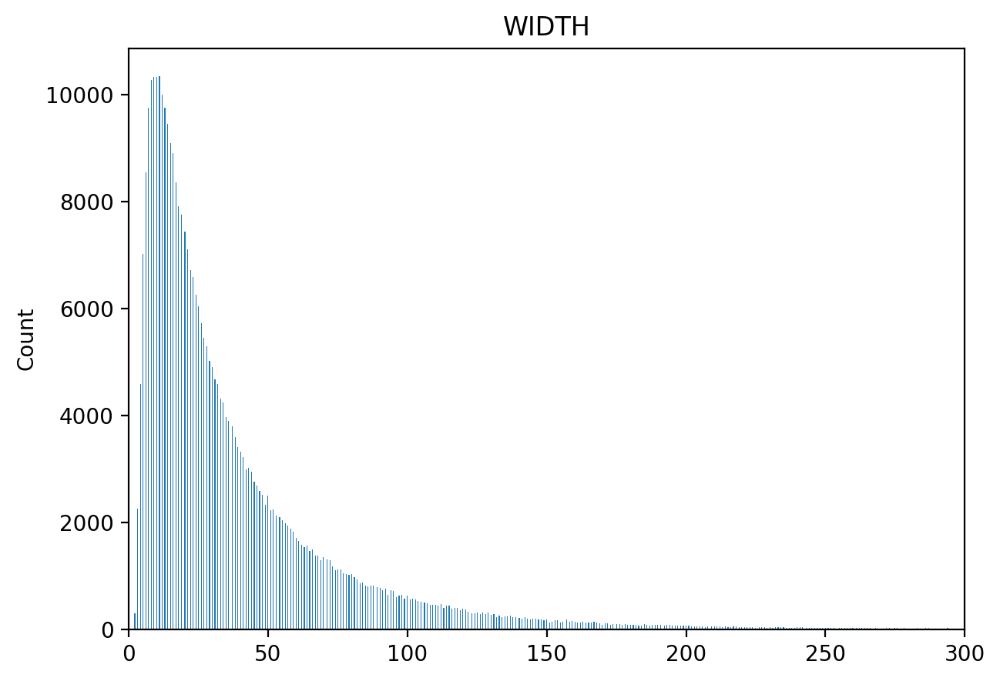

In [11]:
# Plot Histogram on x
plt.hist(df["width"], bins=3000)
plt.gca().set(title='WIDTH', ylabel='Count');
plt.xlim(0,300)
plt.savefig('report/1-width.png') 

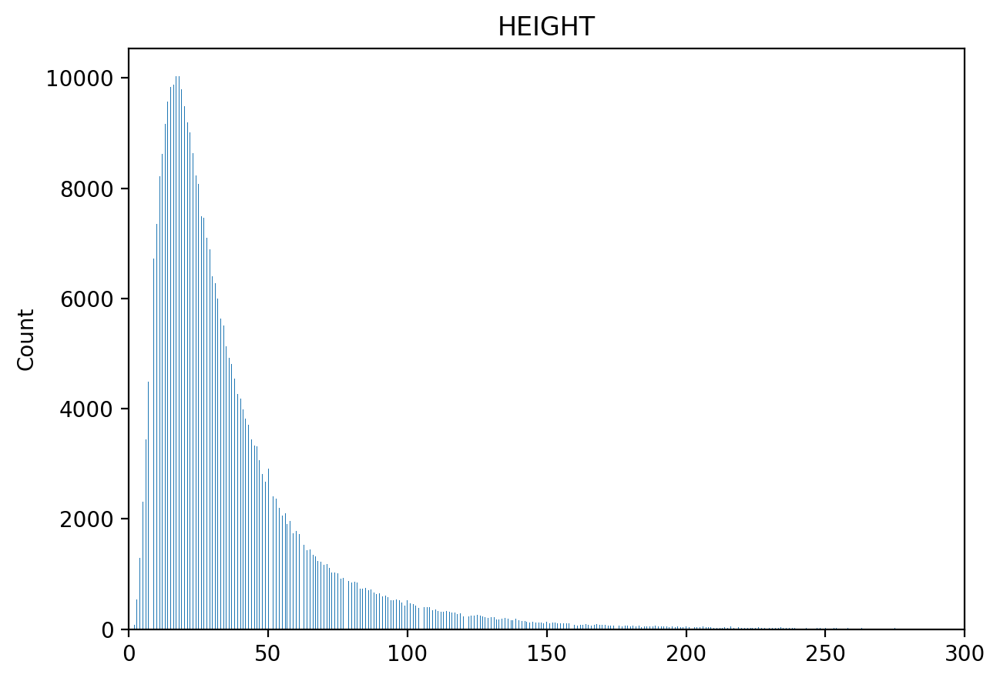

In [12]:
plt.hist(df["height"], bins=3000)
plt.gca().set(title='HEIGHT', ylabel='Count');
plt.xlim(0,300)
plt.savefig('report/1-height.png') 

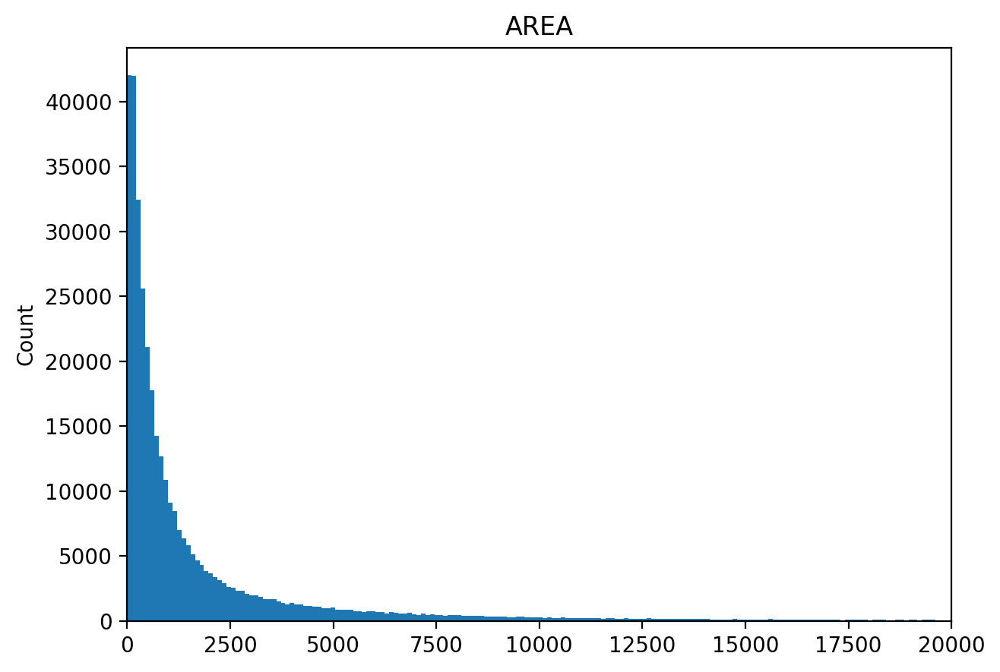

In [13]:
plt.hist(df["area"], bins=3000)
plt.gca().set(title='AREA', ylabel='Count');
plt.xlim(0,20000)
plt.savefig('report/1-area.png') 

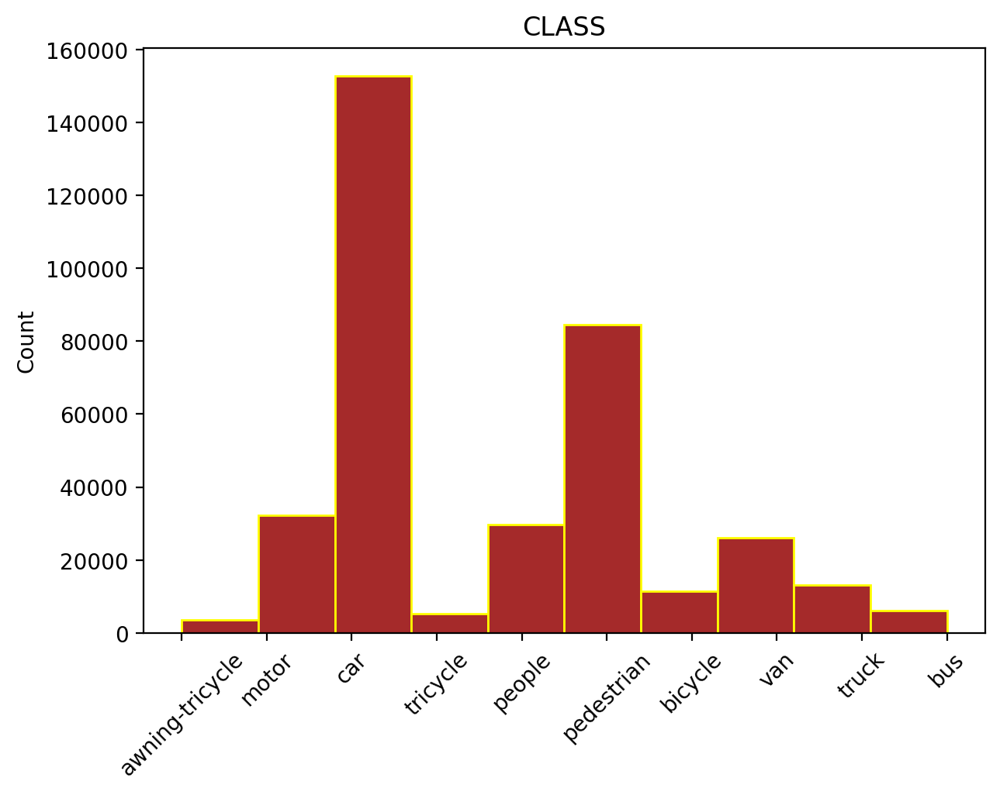

In [14]:
plt.hist(df["class"], edgecolor="yellow", color="brown")
plt.gca().set(title='CLASS', ylabel='Count');
plt.xticks(rotation=45)
plt.savefig('report/2-class.png') 
# plt.xlim(0,25000)

In [15]:
# 3-1 從資料集中隨機抽取影像(兩張)，將標準答案的框框畫上去，並標註類別名稱

In [46]:
import matplotlib.colors as mcolors
color_list = list(mcolors.TABLEAU_COLORS)

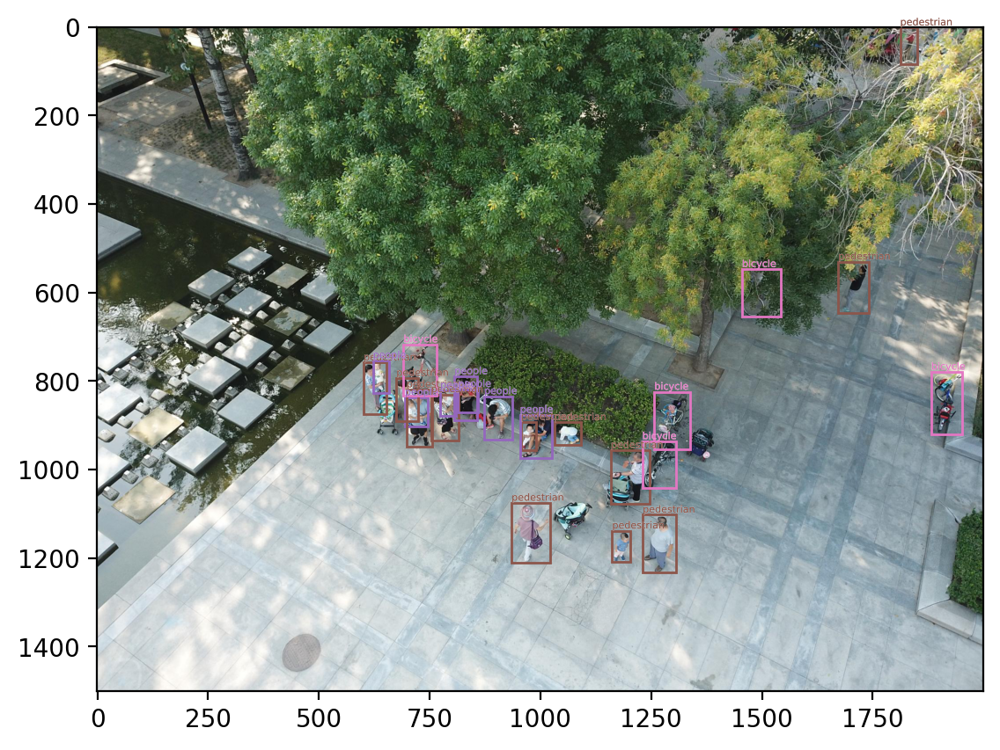

In [48]:
d = df.query('img_path == "train2017/9999998_00033_d_0000026.jpg"')

# Draw
im = Image.open('visdrone/' + d["img_path"].iloc[0])

# Create figure and axes
fig, ax = plt.subplots()

# Display the image
ax.imshow(im)
    
# Draw Border
for index, row in d.iterrows():
#     print(row['x1'], row['x2'])
    
    class_label = 0
    if row["class"] == 'awning-tricycle':
        class_label = 0
    elif row["class"] == 'motor':
        class_label = 1
    elif row["class"] == 'car':
        class_label = 2
    elif row["class"] == 'tricycle':
        class_label = 3
    elif row["class"] == 'people':
        class_label = 4
    elif row["class"] == 'pedestrian':
        class_label = 5
    elif row["class"] == 'bicycle':
        class_label = 6
    elif row["class"] == 'van':
        class_label = 7
    elif row["class"] == 'truck':
        class_label = 8
    elif row["class"] == 'bus':
        class_label = 9
    
    # Create a Rectangle patch
    rect = patches.Rectangle((row["x1"], row["y1"]), row["width"], row["height"], linewidth=1, edgecolor=color_list[class_label], facecolor='none')

#     Add the patch to the Axes
    ax.add_patch(rect)
                
    txt = plt.text(row["x1"], row["y1"]-5, row["class"], color=color_list[class_label], size=4)
    txt.set_path_effects([PathEffects.withStroke(linewidth=0.1, foreground='w')])
        
plt.savefig('report/3-1-1.png') 
plt.show()

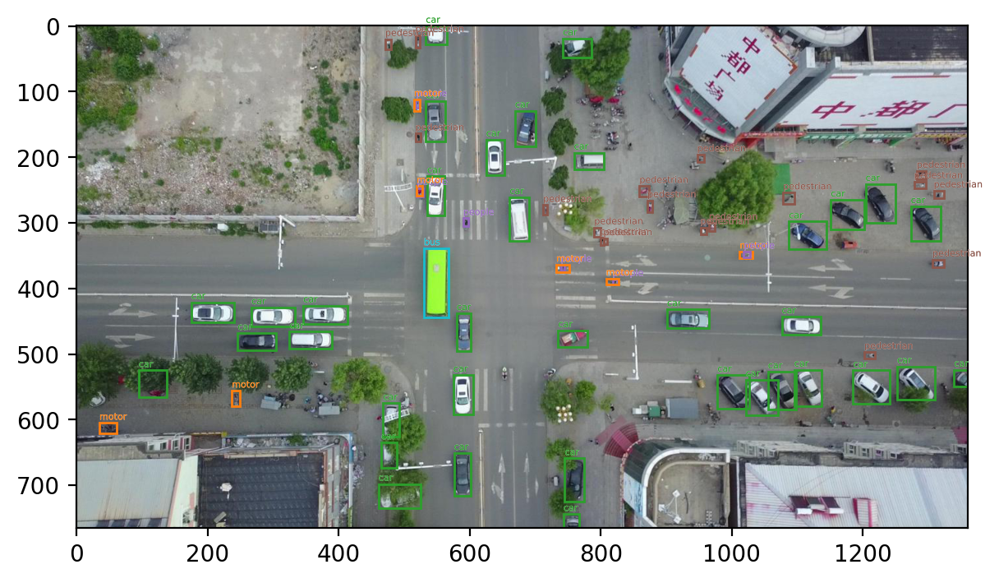

In [49]:
d = df.query('img_path == "val2017/0000333_00001_d_0000001.jpg"')

# Draw
im = Image.open('visdrone/' + d["img_path"].iloc[0])

# Create figure and axes
fig, ax = plt.subplots()

# Display the image
ax.imshow(im)
    
# Draw Border
for index, row in d.iterrows():
#     print(row['x1'], row['x2'])
    
    class_label = 0
    if row["class"] == 'awning-tricycle':
        class_label = 0
    elif row["class"] == 'motor':
        class_label = 1
    elif row["class"] == 'car':
        class_label = 2
    elif row["class"] == 'tricycle':
        class_label = 3
    elif row["class"] == 'people':
        class_label = 4
    elif row["class"] == 'pedestrian':
        class_label = 5
    elif row["class"] == 'bicycle':
        class_label = 6
    elif row["class"] == 'van':
        class_label = 7
    elif row["class"] == 'truck':
        class_label = 8
    elif row["class"] == 'bus':
        class_label = 9
    
    # Create a Rectangle patch
    rect = patches.Rectangle((row["x1"], row["y1"]), row["width"], row["height"], linewidth=1, edgecolor=color_list[class_label], facecolor='none')

#     Add the patch to the Axes
    ax.add_patch(rect)
                
    txt = plt.text(row["x1"], row["y1"]-5, row["class"], color=color_list[class_label], size=4)
    txt.set_path_effects([PathEffects.withStroke(linewidth=0.1, foreground='w')])
        
plt.savefig('report/3-1-2.png') 
plt.show()

In [50]:
# 3-2
# 取出"car" 類別統計中面積統計資訊排序第 5% / 10% / 50% / 90% / 95% 的影像，
# 除了將標準答案畫上去之外，也將該框框特別標註(用不同的顏色視覺化)

df["area"].quantile([.05, .1, .5, .9, .95])

0.05      60.0
0.10     100.0
0.50     672.0
0.90    5544.4
0.95    9720.0
Name: area, dtype: float64

In [51]:
def outputCarAreaQuantile(point_list):
    for idx, point in enumerate(point_list):
        d = df.query('`class` == "car" and area == area.quantile('+ point +')').iloc[2] # can change!
        im = Image.open('visdrone/'+ d["img_path"])

        # Create figure and axes
        fig, ax = plt.subplots()

        # Display the image
        ax.imshow(im)

        # Create a Rectangle patch
        rect = patches.Rectangle((d["x1"], d["y1"]), d["width"], d["height"], linewidth=1, edgecolor=color_list[idx], facecolor='none', label='lla')

        # Add the patch to the Axes
        ax.add_patch(rect)
                
        txt = plt.text(d["x1"]-10, d["y1"]-10, point, color=color_list[idx])
        txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='w')])
        
        plt.savefig('report/3-car_quantile_0'+ point +'.png') 
        plt.show()

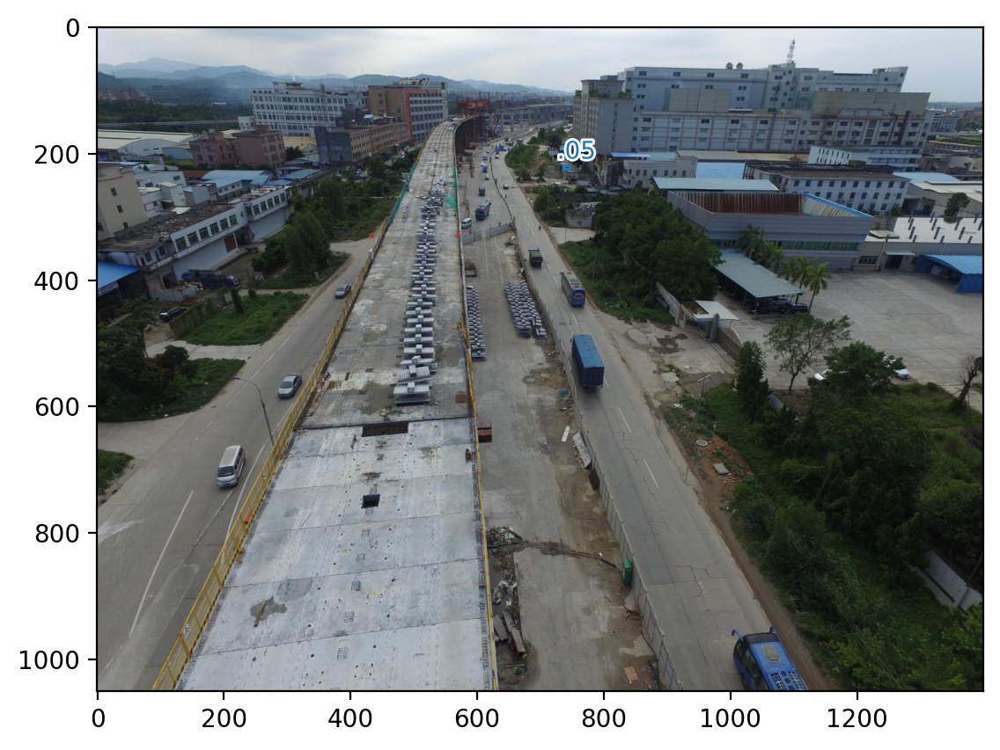

In [52]:
point_list=[".05"]
outputCarAreaQuantile(point_list)

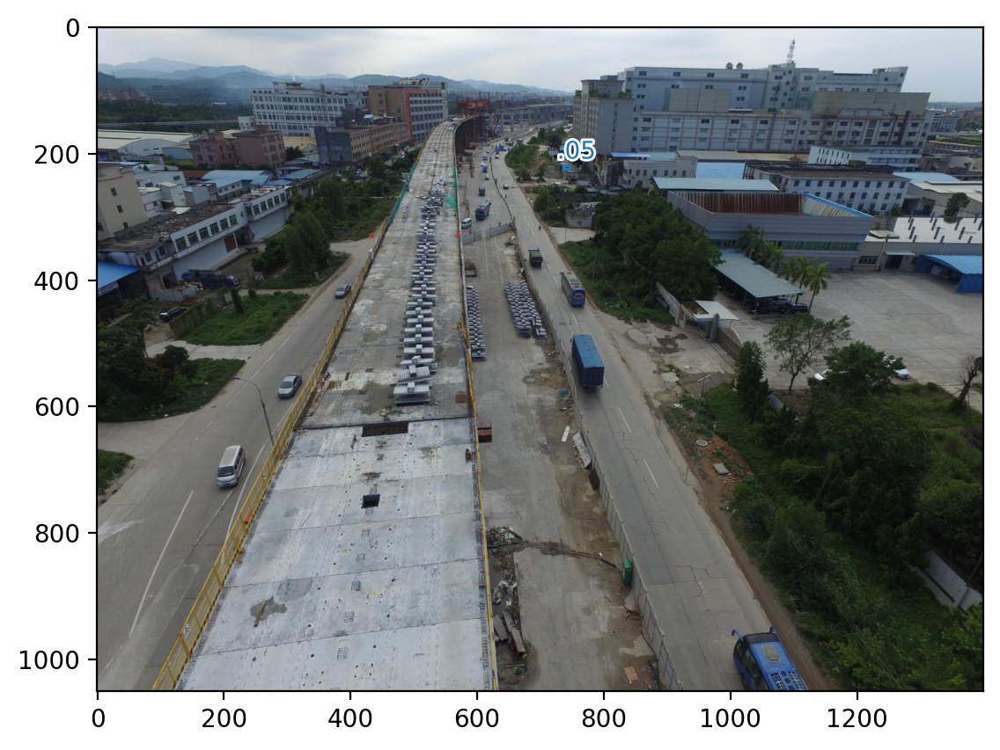

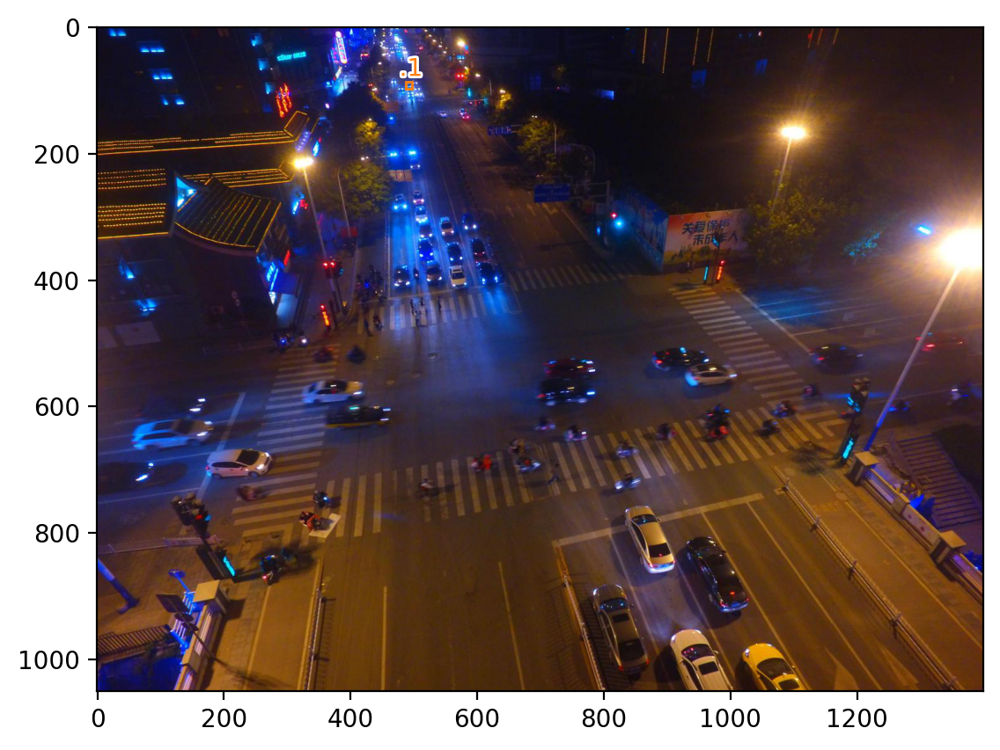

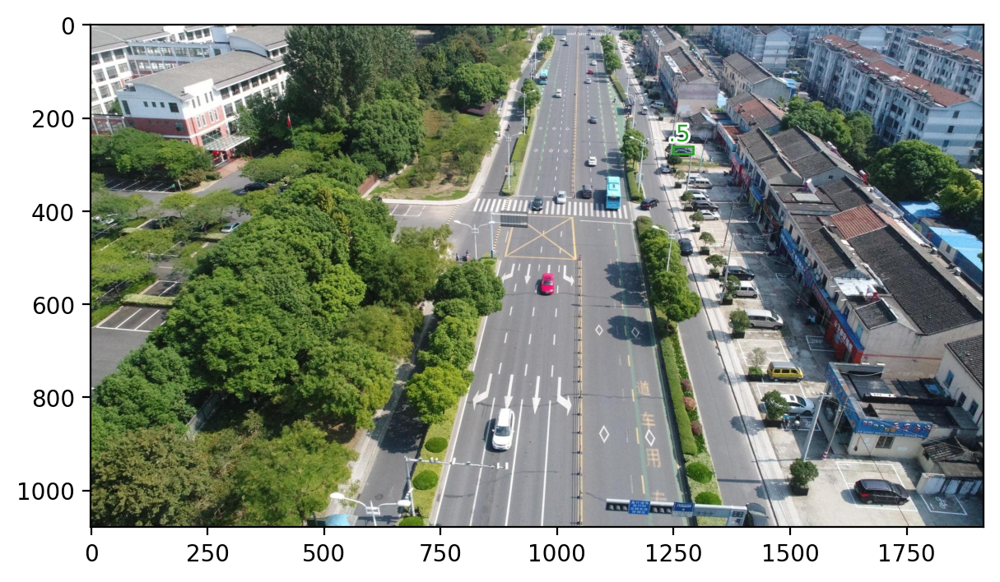

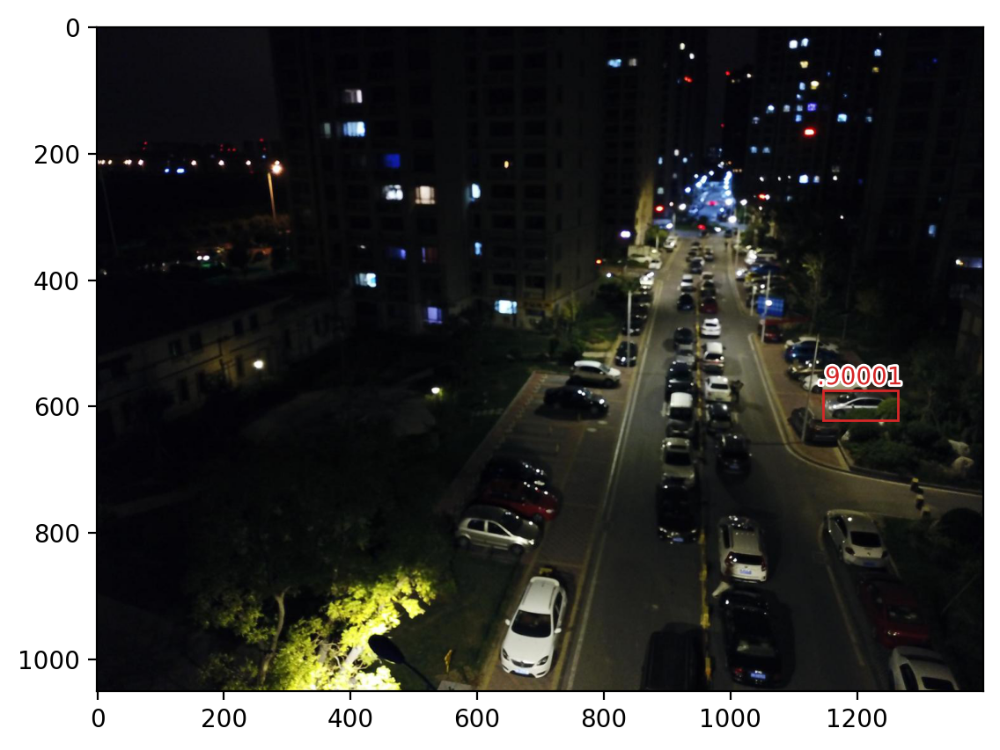

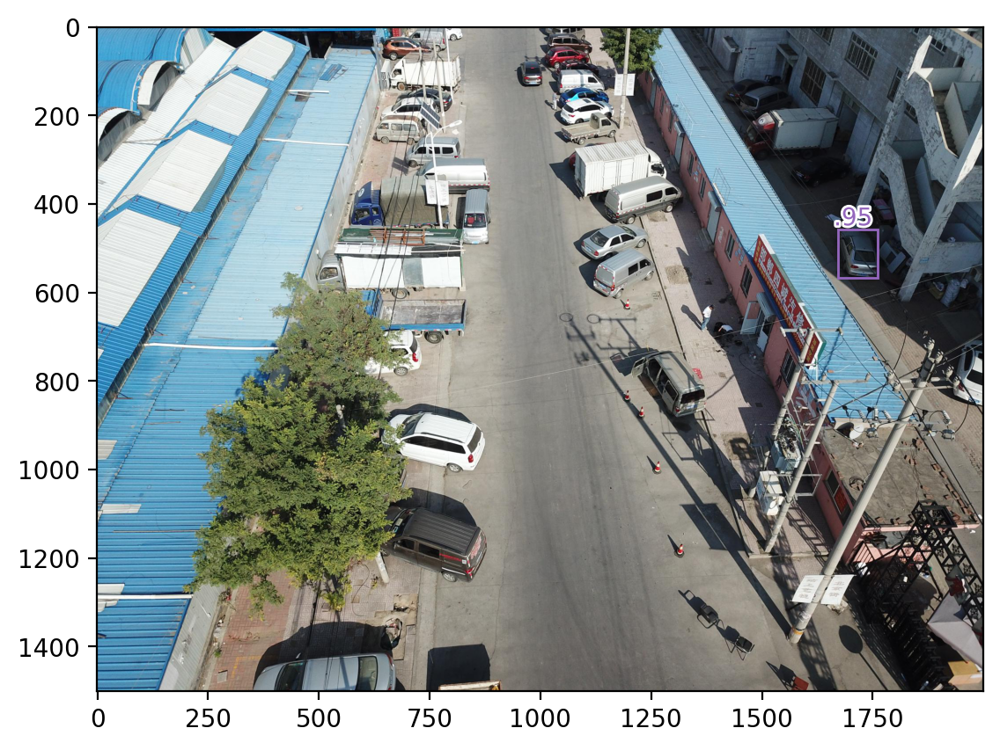

In [53]:
point_list=[".05", ".1", ".5", ".90001", ".95"]
outputCarAreaQuantile(point_list)